In [292]:
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('seaborn')
plt.rcParams['figure.dpi'] = 300

In [374]:
data_root = '/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/'
output_dir = '/Users/randal/courses/cs_291a/major_project/1337PACK/report/new_figs/'

## Codebox
### Tsung log parser

In [411]:
class TsungResults:
    
    def __init__(self, path, name=None):
        from pathlib import Path
        self.path = Path(path)
        if name is None:
            if self.path.is_file():
                name = self.path.parent
            else:
                name = self.path.name
                self.path = str(self.path) + '/tsung.log'
        self.name = name
        self.stats_list = set()
        self.parse_tsung_log()

    def parse_tsung_log(self):
        """Parse tsung.log file
        """
        import pandas as pd
        base_time = None
        with open(self.path, 'r') as handle:
            not_eof = True
            while not_eof:
                line = handle.readline()
                if line[0] == '#':
                    # start of time line
                    current_time = int(line.split()[-1])
                    if base_time is None:
                        base_time = current_time
                    current_time = current_time - base_time
                elif 'EndMonitor' in line:
                    not_eof = False
                else:
                    # stats line
                    stat = line.split()[1]
                    if stat not in self.stats_list:
                        self.stats_list.add(stat)
                        setattr(self, stat, {})
                    values = line.split()[2:]
                    if len(values) == 2:
                        getattr(self, stat)[current_time] = pd.Series(
                            {'count': float(values[0]), 
                             'total_count': float(values[1])}
                        )
                    else:
                        getattr(self, stat)[current_time] = pd.Series(
                            {'10sec_count': float(values[0]),
                             '10sec_mean': float(values[1]),
                             '10sec_stddev': float(values[2]),
                             'max': float(values[3]),
                             'min': float(values[4]),
                             'mean': float(values[5]),
                             'count': float(values[6])}
                        )
        for stat in self.stats_list:
            setattr(self, stat, pd.DataFrame(getattr(self, stat)).T)
            
    def plot_line(self, stat, col_name, ax, alias=None, **kwargs):
        import numpy as np
        import pandas as pd

        if isinstance(stat, str):
            stat = [stat]
        data = {}
        for s in stat:
            try:
                data[s] = getattr(self, s)[col_name]
            except AttributeError:
                print(f'No {s} found')

        if data == {}:
            ax.plot([], [], label=alias, zorder=2, **kwargs)
        else:
            data = pd.DataFrame(data).sum(axis=1)
            time = data.index
            ax.plot(time, data, label=alias, zorder=2, **kwargs)
            
            
            
            

def save_fig(save_to):
    fig = plt.gcf()
    fig.savefig(save_to, bbox_inches='tight', dpi=300)
    plt.show()

### Plots

In [440]:
#################### SINGLE TEST #####################

def transac_plot(test, ax, show_x=True, show_y_left=True, show_y_right=True, add_legend=False, alias=None, ylim=(0, 1e5), xlim=(0, 1_000), **kwargs):
    if alias is None:
        ax.set_title(test.name.title(), fontsize=12)
    else:
        ax.set_title(alias, fontsize=12)
    
    test.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.3, alias='Users')

    
    transactions = [
        ('Login', ('tr_login_1', 'tr_login_2'), '#87554C'),
        ('Get comments', ('tr_get_all_comments_1', 'tr_get_all_comments_2'), '#919FCB'),
        ('Get all events', ('tr_get_all_events_1', 'tr_get_all_events_2'), '#F39730'),
        ('Index page', ('tr_get_front_page_1', 'tr_get_front_page_2'), '#F8DB36'),
        ('Get one event', ('tr_get_one_event_2', 'tr_get_single_event_1'), '#1C7725'),
        ('Post event', ('tr_post_event'), '#70C7C7'),
        ('Send RSVP', ('tr_send_rsvp'), '#B2112A')
    ]
    
    
    ax1 = ax.twinx()
    for name, lines, color in transactions:
        test.plot_line(stat=lines, col_name='10sec_mean', ax=ax1, color=color, alpha=0.8, alias=name, **kwargs)
    if show_x:
        ax.set_xlabel('Seconds elapsed', fontsize=12)
    else:
        ax.set_xticklabels = []
    if show_y_left:
        ax.set_ylabel('Simultaneous connections', fontsize=12)
        ax.tick_params(labelsize=12)
    else:
        ax.set_yticklabels = []
    if show_y_right:
        ax1.set_ylabel('10 sec mean duration (ms)', fontsize=12)
        ax1.tick_params(labelsize=12)
    else:
        ax1.get_yaxis().set_visible(False)
    ax1.grid(b=False, which='both', axis='y')

    ax1.set_ylim(*ylim)
    ax1.set_xlim(*xlim)
    
    if add_legend:
        ax.legend(loc='upper center')
        ax1.legend(loc='upper left')
        
        
def http_plot(test, ax, show_x=True, show_y_left=True, show_y_right=True, add_legend=False, alias=None, ylim=(0, 1e5), xlim=(0, 1_000), **kwargs):
    if alias is None:
        ax.set_title(test.name.title(), fontsize=12)
    else:
        ax.set_title(alias, fontsize=12)
        
    test.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.3, alias='Users')
    
    transactions = [
        ('2xx', ('200', '201'), '#2C73B4'),
        ('4xx', ('401', '409'), '#810080'),
        ('5xx', ('500', '502', '503', '504'), '#B2112A')
    ]
    
    ax1 = ax.twinx()
    for name, lines, color in transactions:
        test.plot_line(stat=lines, col_name='count', ax=ax1, color=color, alpha=0.8, alias=name, **kwargs)
    ax.tick_params(labelsize=12)
    ax1.tick_params(labelsize=12)
    if show_x:
        ax.set_xlabel('Seconds elapsed', fontsize=12)
        
    else:
        ax.set_xticklabels = []
    if show_y_left:
        ax.set_ylabel('Simultaneous connections', fontsize=12)
        ax.tick_params(labelsize=12)
    else:
        ax.set_yticklabels = []
    if show_y_right:
        ax1.set_ylabel('Number of HTTP responses per 10 sec', fontsize=12)
    else:
        ax1.get_yaxis().set_visible(False)
    ax1.grid(b=False, which='both', axis='y')

    ax1.set_ylim(*ylim)
    ax1.set_xlim(*xlim)
    
    if add_legend:
        ax.legend(loc='upper center')
        ax1.legend(loc='upper left')


In [447]:
#################### PAIRWISE COMPARE #####################
#### Base test: test 1

def pairwise_http(title, test1, test2, alias1, alias2, lw=1.5):
    fig, ax = plt.subplots(1, 1, figsize=[8, 6])
    ax.set_title(title, fontsize=14)

    test1.plot_line(stat='fake', col_name='count', ax=ax, lw=lw, ls='--',
                    color='#151515', alias=alias1)
    test2.plot_line(stat='fake', col_name='count', ax=ax, lw=lw, 
                    color='#151515', alias=alias2)
    # codes
    test1.plot_line(stat='fake', col_name='count', ax=ax, color='#2C73B4', lw=lw,
                    alias='2xx response')
    test1.plot_line(stat='fake', col_name='count', ax=ax, color='#B2112A', lw=lw,
                    alias='4xx response')
    test1.plot_line(stat='fake', col_name='count', ax=ax, color='#810080', lw=lw,
                    alias='5xx response')

    test1.plot_line(stat=['200', '201'], col_name='count', ax=ax, lw=lw, ls='--',
                     color='#2C73B4')
    test2.plot_line(stat=['200', '201'], col_name='count', ax=ax, lw=lw,
                      color='#2C73B4')

    test1.plot_line(stat=['404', '422'], col_name='count', ax=ax, lw=lw, ls='--',
                     color='#B2112A')
    test2.plot_line(stat=['404', '422'], col_name='count', ax=ax, lw=lw,
                      color='#B2112A')

    test1.plot_line(stat=['500', '503', '502', '504'], col_name='count', ax=ax, lw=lw, ls='--',
                     color='#810080')
    test2.plot_line(stat=['500', '503', '502', '504'], col_name='count', ax=ax, lw=lw,
                      color='#810080')

    ax.tick_params(labelsize=12)
    ax.set_xlabel('Seconds elapsed', fontsize=12)
    ax.set_ylabel('Number of HTTP responses per 10 sec', fontsize=12)

    ax.legend(loc='upper left').set_zorder(3)

    
    
def pairwise_transactions(title, test1, test2, alias1, alias2):
    lw = 1.5
    markersize=3
    markeredgewidth=1.5
    
    fig, ax = plt.subplots(1, 1, figsize=[8, 6])
    ax.set_title(title, fontsize=14)
    test1.plot_line(stat='fake', col_name='count', ax=ax, lw=lw, color='#2C73B4', alias=alias1)
    test2.plot_line(stat='fake', col_name='count', ax=ax, lw=lw, color='#F39730', alias=alias2)
    
    transactions = [
        ('Login', ('tr_login_1', 'tr_login_2'), '.'),
        ('Get comments', ('tr_get_all_comments_1', 'tr_get_all_comments_2'), 'x'),
        ('Get all events', ('tr_get_all_events_1', 'tr_get_all_events_2'), 'o'),
        ('Index page', ('tr_get_front_page_1', 'tr_get_front_page_2'), '^'),
        ('Get one event', ('tr_get_one_event_2', 'tr_get_single_event_1'), 's'),
        ('Post event', ('tr_post_event'), '>'),
        ('Send RSVP', ('tr_send_rsvp'), 'd')
    ]
    
    transactions = [
        ('Create events', ('tr_create_event_txn'), '.'),
        ('Get all events', ('tr_get_all_events'), 'x'),
        ('Get one events', ('tr_get_one_events_txn'), 'o'),
        ('Create invite', ('tr_invite_create_txn'), '^'),
        ('Create user', ('tr_user_create_txn'), 's'),
        
    ]
    
    for name, lines, marker in transactions:
        test1.plot_line(stat='fake', col_name='count', ax=ax, marker=marker, lw=lw, color='#151515',
                        markersize=markersize, markeredgewidth=markeredgewidth, alias=name)
    
    for name, lines, marker in transactions:
        test1.plot_line(stat=lines, col_name='10sec_mean', ax=ax, color='#2C73B4', alpha=0.8, marker=marker,
                        markersize=markersize, lw=lw, markeredgewidth=markeredgewidth)
    for name, lines, marker in transactions:
        test2.plot_line(stat=lines, col_name='10sec_mean', ax=ax, color='#F39730', alpha=0.8, marker=marker,
                        markersize=markersize, lw=lw, markeredgewidth=markeredgewidth)
   
    
    ax.legend(loc='upper left')
    ax.set_xlabel('Seconds elapsed', fontsize=12)
    ax.set_ylabel('10 sec mean duration (ms)', fontsize=12)
    ax.tick_params(labelsize=12)


## No optimization
### t3.micro

In [225]:
no_opt = TsungResults(path='/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/archived_2019-12-2/t3_micro/without_opt/')

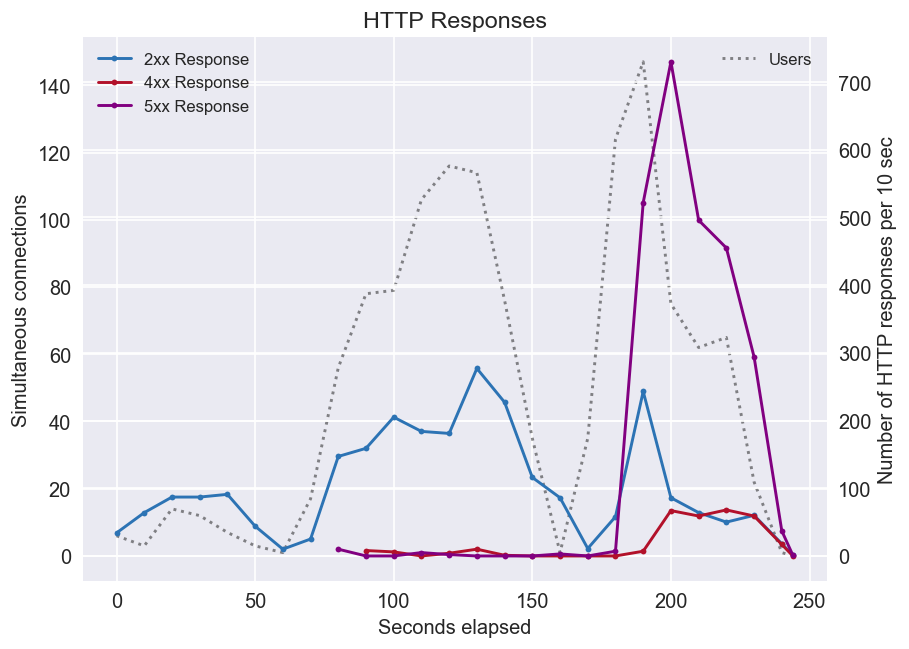

In [227]:
fig, ax = plt.subplots(1, 1, figsize=[8, 6])
ax.set_title('HTTP Responses', fontsize=14)

no_opt.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.5, alias='Users')
ax1 = ax.twinx()
no_opt.plot_line(stat=['200', '201'], col_name='count', ax=ax1, marker='.', color='#2C73B4', alias='2xx Response')
no_opt.plot_line(stat=['422', '404'], col_name='count', ax=ax1, marker='.', color='#B2112A', alias='4xx Response')
no_opt.plot_line(stat=['500', '502'], col_name='count', ax=ax1, marker='.', color='#810080', alias='5xx Response')
ax1.legend()
ax.legend()
ax.tick_params(labelsize=12)
ax1.tick_params(labelsize=12)
ax.set_xlabel('Seconds elapsed', fontsize=12)
ax.set_ylabel('Simultaneous connections', fontsize=12)
ax1.set_ylabel('Number of HTTP responses per 10 sec', fontsize=12)

save_fig('courses/cs_291a/major_project/1337PACK/report/figs/no-opt-http-response.pdf')

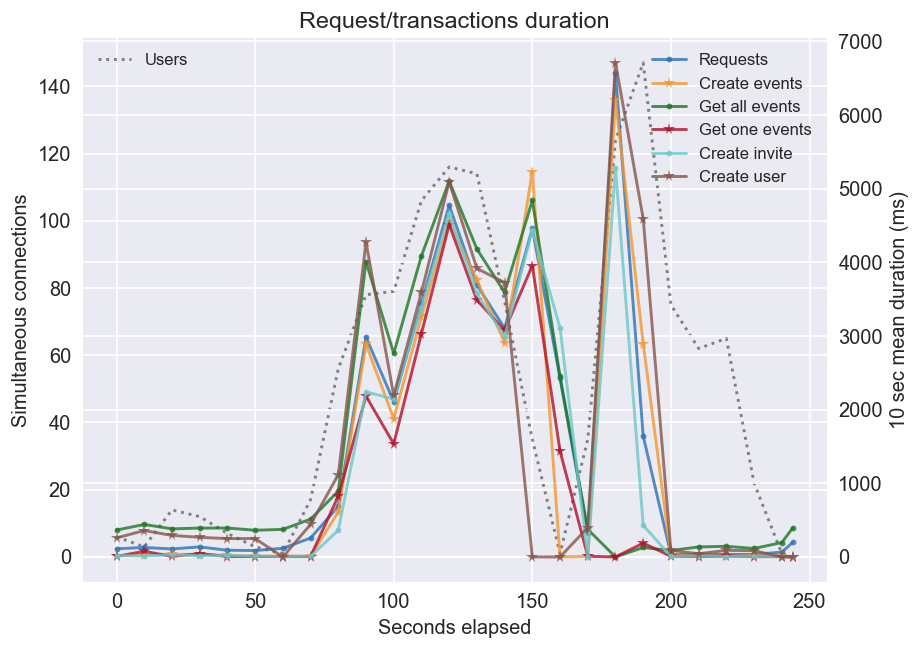

In [234]:
fig, ax = plt.subplots(1, 1, figsize=[8, 6])
ax.set_title('Request/transactions duration', fontsize=14)
no_opt.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.5, alias='Users')
ax1 = ax.twinx()
no_opt.plot_line(stat='request', col_name='10sec_mean', ax=ax1, marker='.',
          color='#2C73B4', alias='Requests', alpha=0.8)
no_opt.plot_line(stat='tr_create_event_txn', col_name='10sec_mean', ax=ax1, marker='*', 
          color='#F39730', alias='Create events', alpha=0.8)
no_opt.plot_line(stat='tr_get_all_events', col_name='10sec_mean', ax=ax1, marker='.',
          color='#1C7725', alias='Get all events', alpha=0.8)
no_opt.plot_line(stat='tr_get_one_events_txn', col_name='10sec_mean', ax=ax1, marker='*',
          color='#B2112A', alias='Get one events', alpha=0.8)

no_opt.plot_line(stat='tr_invite_create_txn', col_name='10sec_mean', ax=ax1, marker='.',
          color='#70C7C7', alias='Create invite', alpha=0.8)
no_opt.plot_line(stat='tr_user_create_txn', col_name='10sec_mean', ax=ax1, marker='*',
          color='#87554C', alias='Create user', alpha=0.8)

ax.legend(loc='upper left')
ax.set_xlabel('Seconds elapsed', fontsize=12)
ax.set_ylabel('Simultaneous connections', fontsize=12)
ax1.set_ylabel('10 sec mean duration (ms)', fontsize=12)
ax1.legend()
ax.tick_params(labelsize=12)
ax1.tick_params(labelsize=12)
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/no-opt-transactions.pdf')

## Index optimized

### `t3.micro`

In [444]:
no_opt = TsungResults(path='/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/archived_2019-12-2/t3_micro/without_opt/')
opt_idx = TsungResults(path='/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/archived_2019-12-2/t3_micro/index_optimised/')

No fake found
No fake found
No fake found
No fake found
No fake found
No 503 found
No 504 found
No 500 found
No 503 found
No 504 found


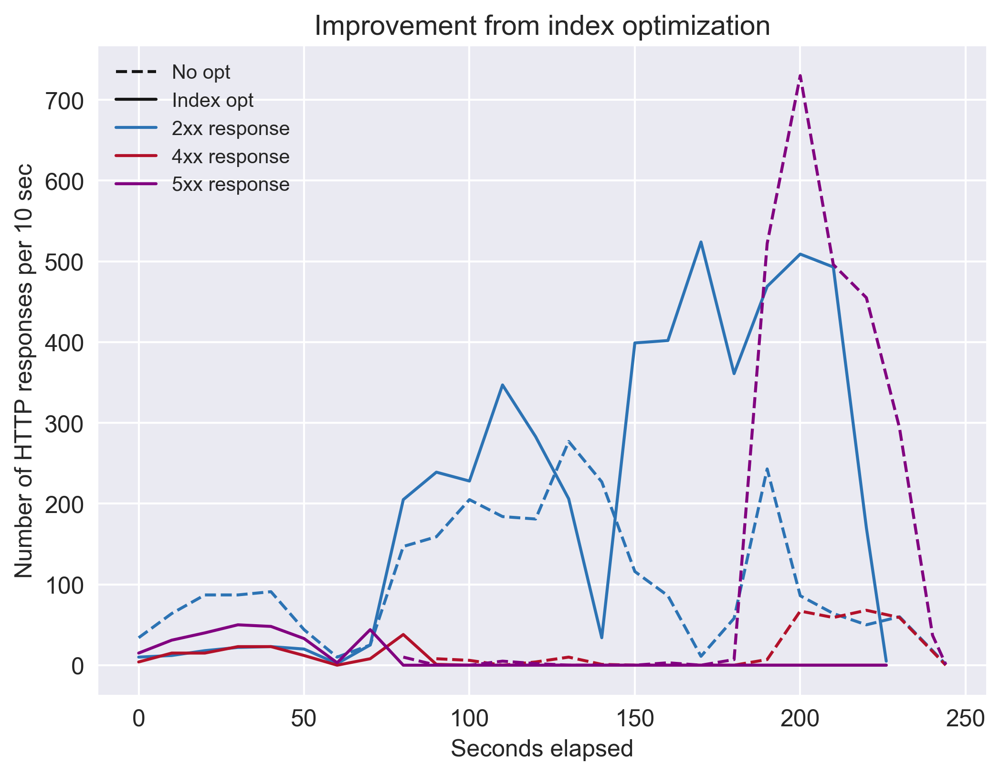

No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found


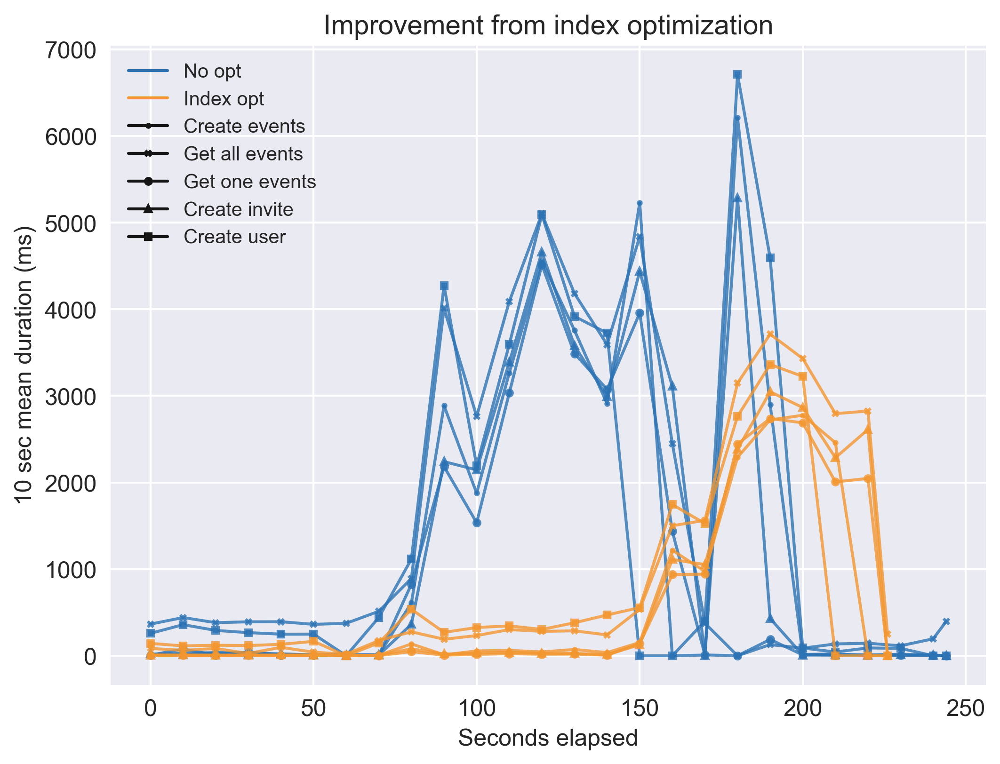

In [448]:
pairwise_http(title='Improvement from index optimization',
              test1=no_opt, alias1='No opt',
              test2=opt_idx, alias2='Index opt')
save_fig(output_dir + 'index-opt-http-response.pdf')

pairwise_transactions(title='Improvement from index optimization',
                     test1=no_opt, alias1='No opt',
                     test2=opt_idx, alias2='Index opt')
save_fig(output_dir + 'index-opt-transaction-time.pdf')

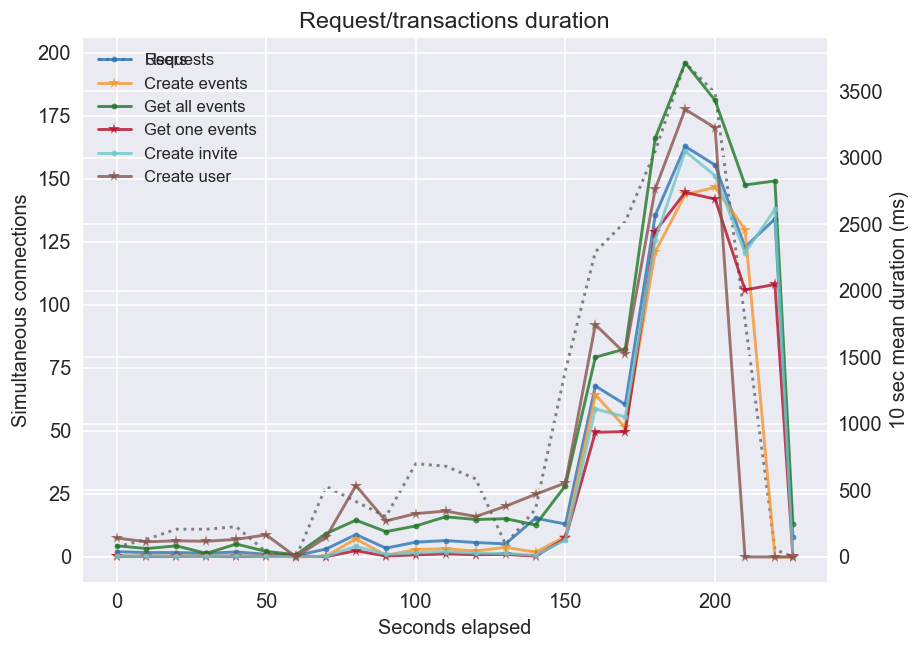

In [232]:
fig, ax = plt.subplots(1, 1, figsize=[8, 6])
ax.set_title('Request/transactions duration', fontsize=14)
opt_index.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.5, alias='Users')
ax1 = ax.twinx()
opt_index.plot_line(stat='request', col_name='10sec_mean', ax=ax1, marker='.',
          color='#2C73B4', alias='Requests', alpha=0.8)
opt_index.plot_line(stat='tr_create_event_txn', col_name='10sec_mean', ax=ax1, marker='*', 
          color='#F39730', alias='Create events', alpha=0.8)
opt_index.plot_line(stat='tr_get_all_events', col_name='10sec_mean', ax=ax1, marker='.',
          color='#1C7725', alias='Get all events', alpha=0.8)
opt_index.plot_line(stat='tr_get_one_events_txn', col_name='10sec_mean', ax=ax1, marker='*',
          color='#B2112A', alias='Get one events', alpha=0.8)

opt_index.plot_line(stat='tr_invite_create_txn', col_name='10sec_mean', ax=ax1, marker='.',
          color='#70C7C7', alias='Create invite', alpha=0.8)
opt_index.plot_line(stat='tr_user_create_txn', col_name='10sec_mean', ax=ax1, marker='*',
          color='#87554C', alias='Create user', alpha=0.8)

ax.legend(loc='upper left')
ax.set_xlabel('Seconds elapsed', fontsize=12)
ax.set_ylabel('Simultaneous connections', fontsize=12)
ax1.set_ylabel('10 sec mean duration (ms)', fontsize=12)
ax1.legend()
ax.tick_params(labelsize=12)
ax1.tick_params(labelsize=12)
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/idx-opt-transactions.pdf')

### Compare index optimization to no optmization

No fake found
No fake found
No fake found
No fake found
No fake found
No 422 found
No 503 found
No 504 found
No 503 found
No 504 found


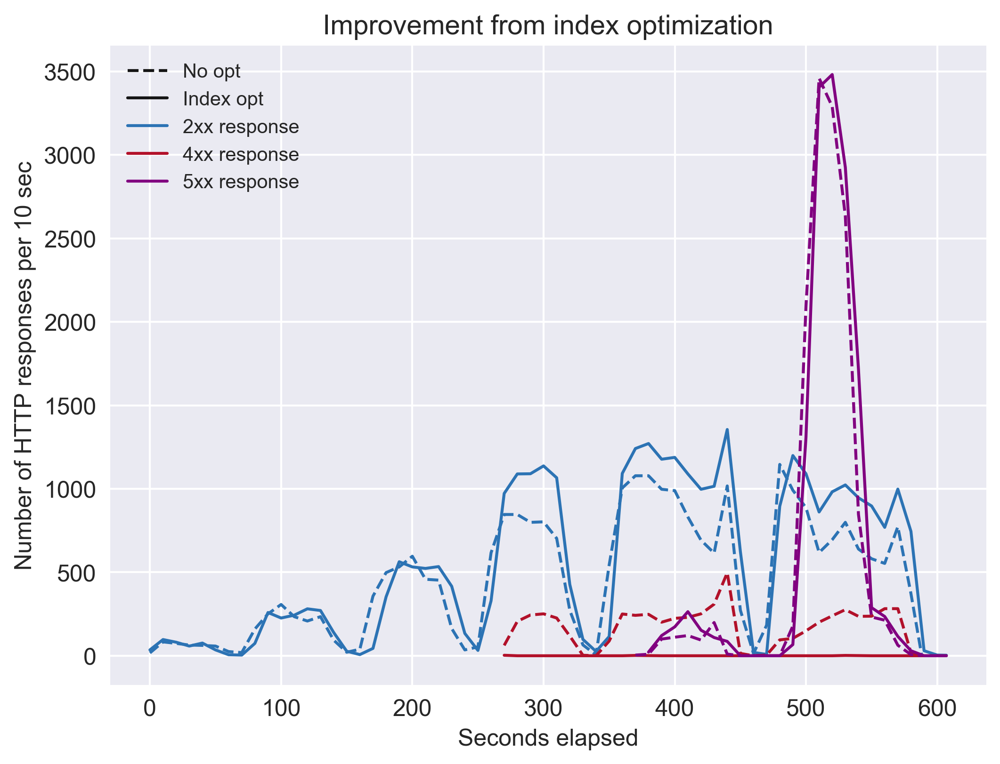

No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found


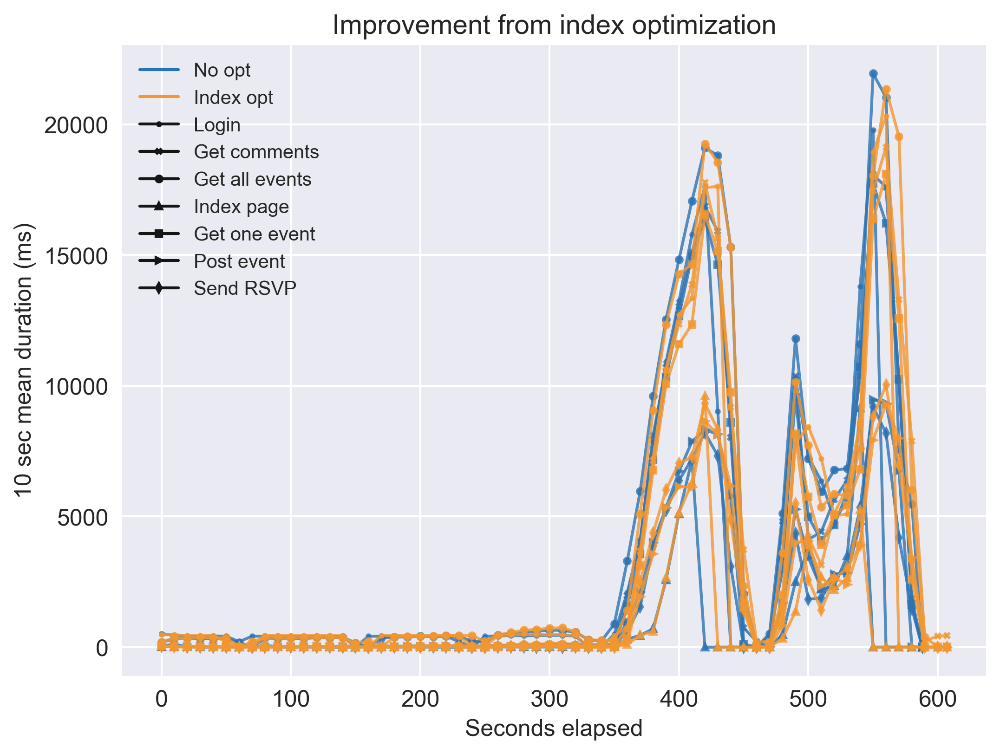

In [413]:
no_opt = TsungResults(path='/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-199/')
opt_idx = TsungResults(path='/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-200/')


pairwise_http(title='Improvement from index optimization',
              test1=no_opt, alias1='No opt',
              test2=opt_idx, alias2='Index opt')
save_fig(output_dir + 'index-opt-http-response.pdf')

pairwise_transactions(title='Improvement from index optimization',
                     test1=no_opt, alias1='No opt',
                     test2=opt_idx, alias2='Index opt')
save_fig(output_dir + 'index-opt-transaction-time.pdf')

### Test on `c4.xlarge` and `m5.large` (200 vs 201)

In [384]:
opt_idx_1k = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-200/')
opt_idx_10k = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-201/')

No fake found
No fake found
No fake found
No fake found
No fake found
No 404 found
No 422 found
No 503 found
No 504 found
No 503 found
No 504 found


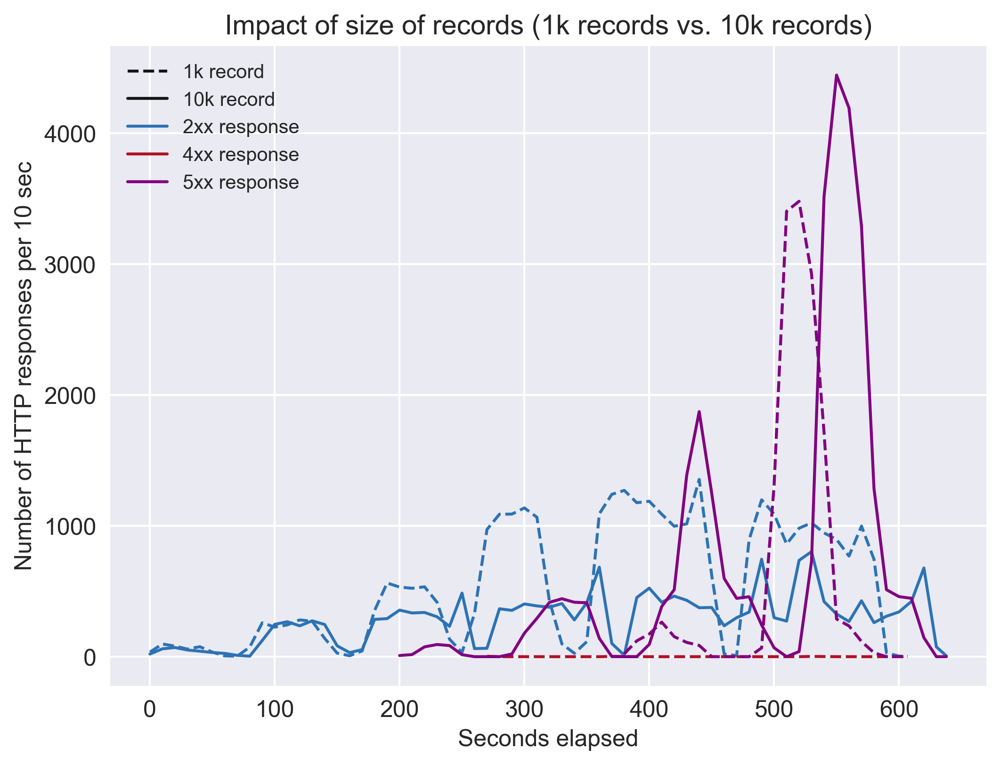

No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found


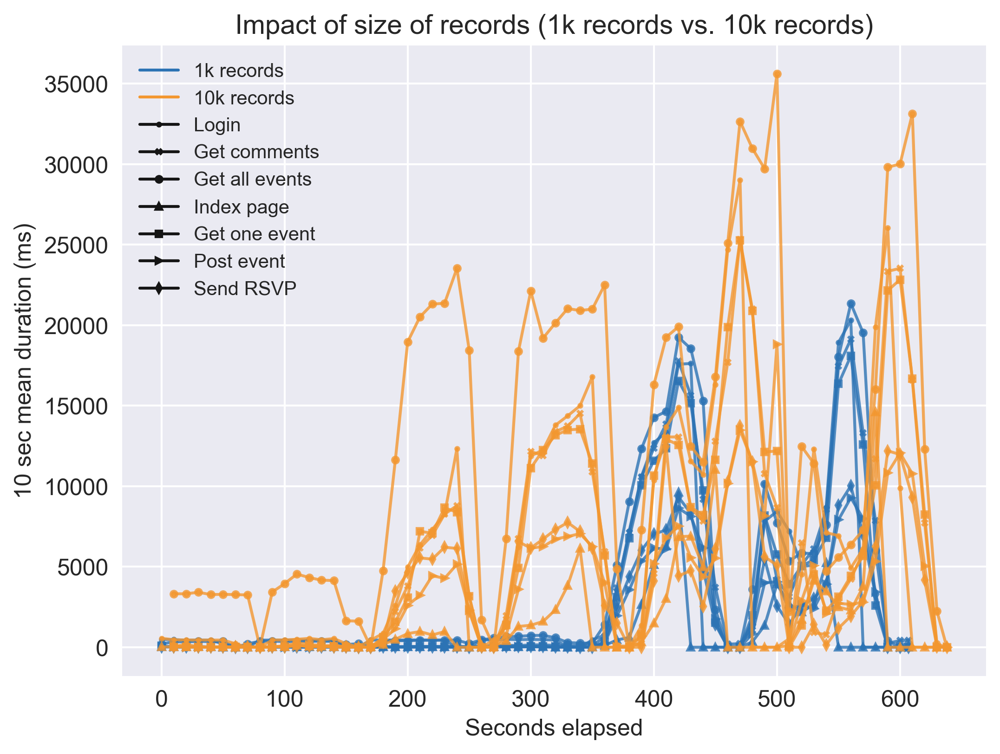

In [385]:
pairwise_http(title='Impact of size of records (1k records vs. 10k records)',
              test1=opt_idx_1k, alias1='1k record',
              test2=opt_idx_10k, alias2='10k record')

save_fig(output_dir + '1k-vs-10k-http.pdf')
pairwise_transactions(title='Impact of size of records (1k records vs. 10k records)',
                     test1=opt_idx_1k, alias1='1k records',
                     test2=opt_idx_10k, alias2='10k records')


save_fig(output_dir + '1k-vs-10k-response-time.pdf')

## Pagination

In [386]:
opt_idx_10k = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-201/')
opt_idx_page_10k = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-203/')

No fake found
No fake found
No fake found
No fake found
No fake found
No 404 found
No 422 found
No 404 found
No 422 found
No 503 found
No 504 found
No 502 found
No 504 found


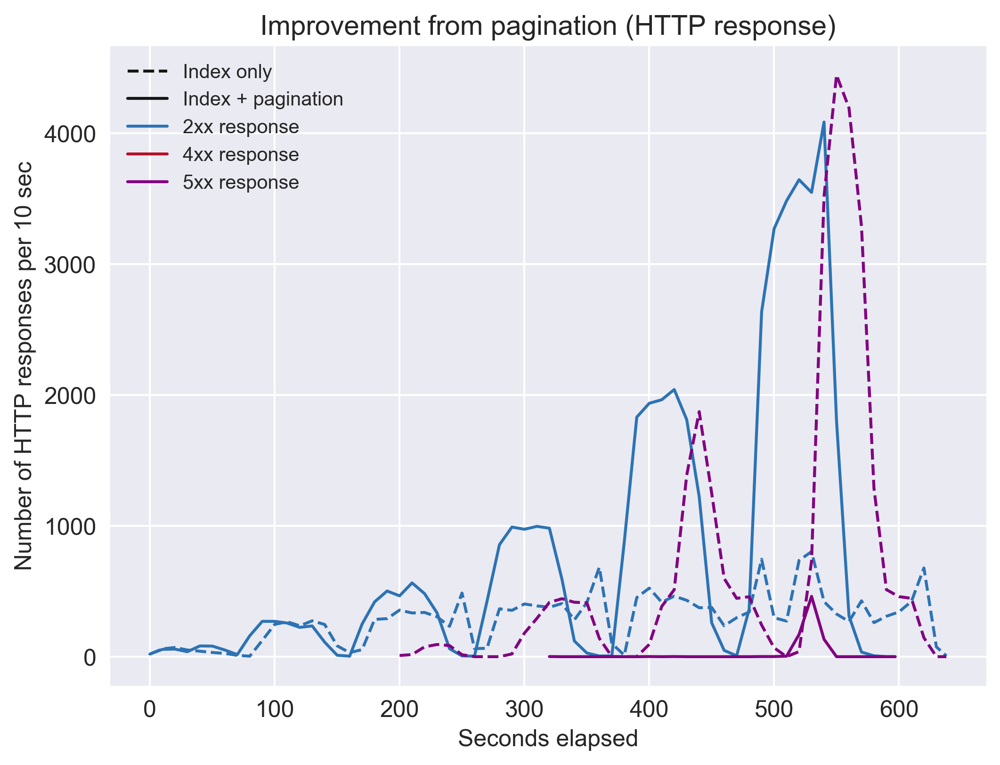

No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found


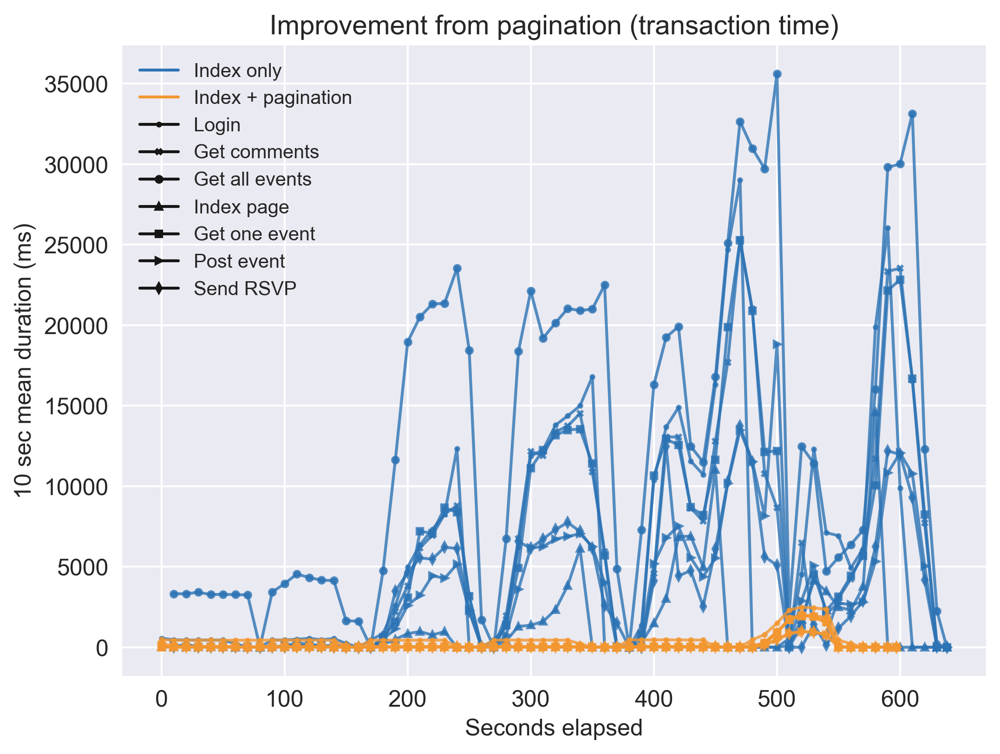

In [387]:
pairwise_http(title='Improvement from pagination (HTTP response)',
              test1=opt_idx_10k, alias1='Index only',
              test2=opt_idx_page_10k, alias2='Index + pagination')

save_fig(output_dir + 'pagination-http.pdf')
pairwise_transactions(title='Improvement from pagination (transaction time)',
                     test1=opt_idx_10k, alias1='Index only',
              test2=opt_idx_page_10k, alias2='Index + pagination')

save_fig(output_dir + 'pagination-response-time.pdf')

## Cache optimization compare to no opt

### In memory caching
4 * c5.xlarge + m5.large

t203: index + pagination


t26: index + pagination + in-memory caching

In [388]:
test1 = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-203')
test2 = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/test-26')

No fake found
No fake found
No fake found
No fake found
No fake found
No 404 found
No 422 found
No 404 found
No 422 found
No 502 found
No 504 found
No 503 found
No 502 found
No 504 found


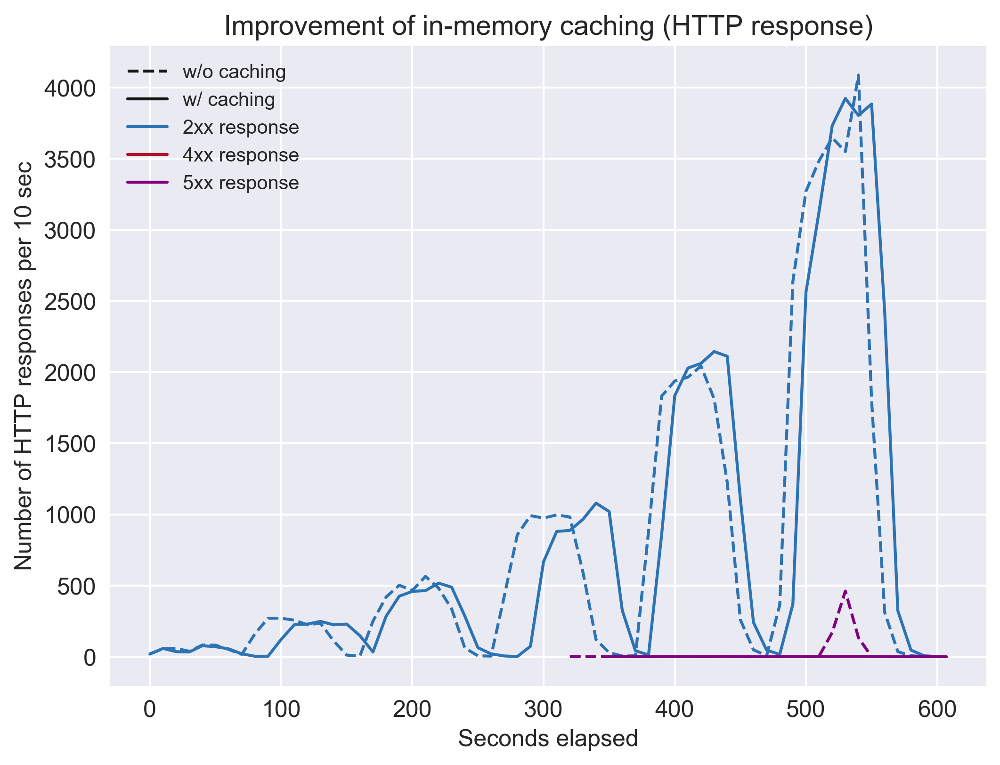

No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found
No fake found


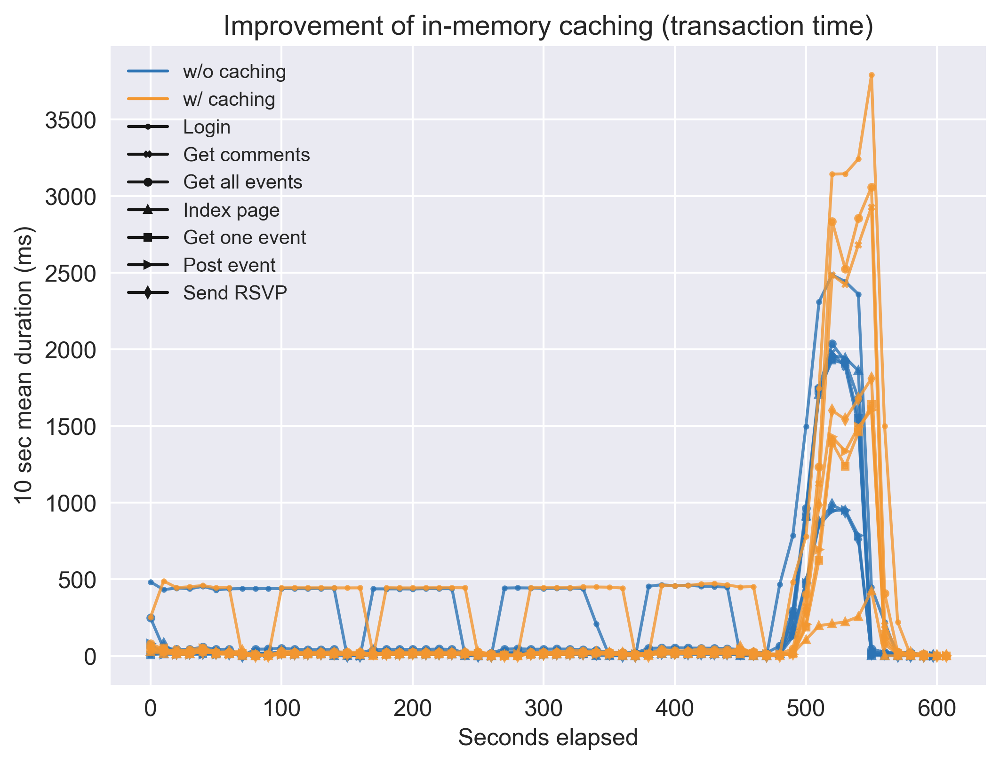

In [392]:
pairwise_http(title='Improvement of in-memory caching (HTTP response)',
              test1=test1, alias1='w/o caching',
              test2=test2, alias2='w/ caching')

save_fig(output_dir + 'in-memory-cache-http.pdf')
pairwise_transactions(title='Improvement of in-memory caching (transaction time)',
                     test1=test1, alias1='w/o caching',
                     test2=test2, alias2='w/ caching')
save_fig(output_dir + 'in-memory-cache-response-time.pdf')

In [237]:
opt_cache = TsungResults('/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/t3_micro/cache_optimised/')

No fake found
No fake found
No 404 found
No 500 found
No 500 found
No 502 found


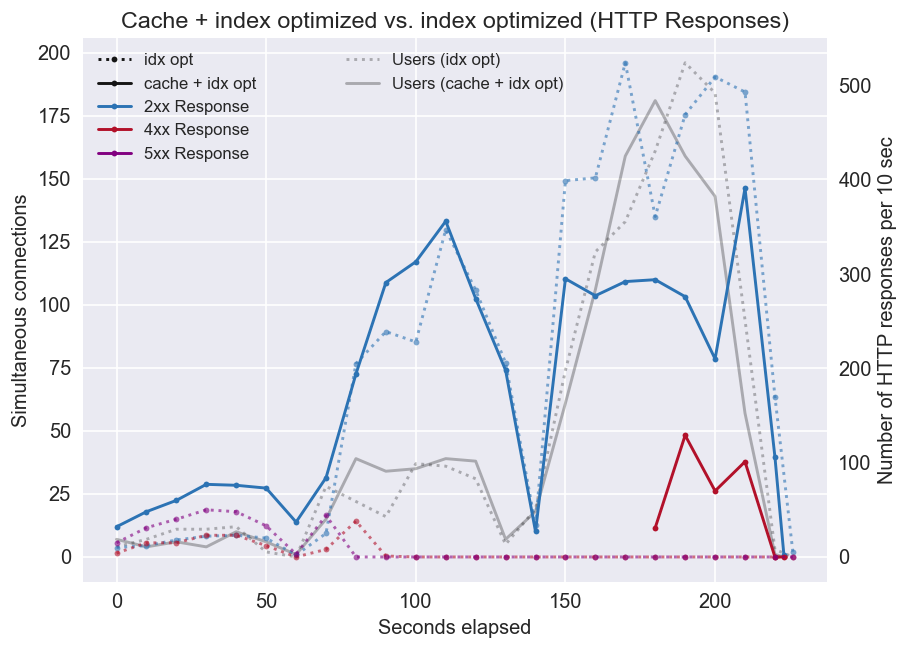

In [241]:
fig, ax = plt.subplots(1, 1, figsize=[8, 6])
ax.set_title('Cache + index optimized vs. index optimized (HTTP Responses)', fontsize=14)


opt_index.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.3, alias='Users (idx opt)')
opt_cache.plot_line(stat='users', col_name='count', ax=ax, color='#151515', alpha=0.3, alias='Users (cache + idx opt)')

ax1 = ax.twinx()
opt_index.plot_line(stat='fake', col_name='count', ax=ax1, marker='.', ls=':', color='#151515', alias='idx opt')
opt_cache.plot_line(stat='fake', col_name='count', ax=ax1, marker='.', color='#151515', alias='cache + idx opt')


opt_index.plot_line(stat=['200', '201'], col_name='count', ax=ax1, marker='.', color='#2C73B4', ls=':', alpha=0.6)
opt_cache.plot_line(stat=['200', '201'], col_name='count', ax=ax1, marker='.', color='#2C73B4', alias='2xx Response')

opt_index.plot_line(stat=['404', '422'], col_name='count', ax=ax1, marker='.', color='#B2112A', ls=':', alpha=0.6)
opt_cache.plot_line(stat=['404', '422'], col_name='count', ax=ax1, marker='.', color='#B2112A', alias='4xx Response')

opt_index.plot_line(stat=['500', '502'], col_name='count', ax=ax1, marker='.', color='#810080', ls=':', alpha=0.6)
opt_cache.plot_line(stat=['500', '502'], col_name='count', ax=ax1, marker='.', color='#810080', alias='5xx Response')


ax.tick_params(labelsize=12)
ax1.tick_params(labelsize=12)
ax.set_xlabel('Seconds elapsed', fontsize=12)
ax.set_ylabel('Simultaneous connections', fontsize=12)
ax1.set_ylabel('Number of HTTP responses per 10 sec', fontsize=12)

ax.legend(loc='upper center').set_zorder(3)
ax1.legend(loc='upper left').set_zorder(3)
ax1.grid(b=False, which='both', axis='y')

save_fig('courses/cs_291a/major_project/1337PACK/report/figs/compare-cache-to-idx-opt-http-response.pdf')


No fake found
No fake found


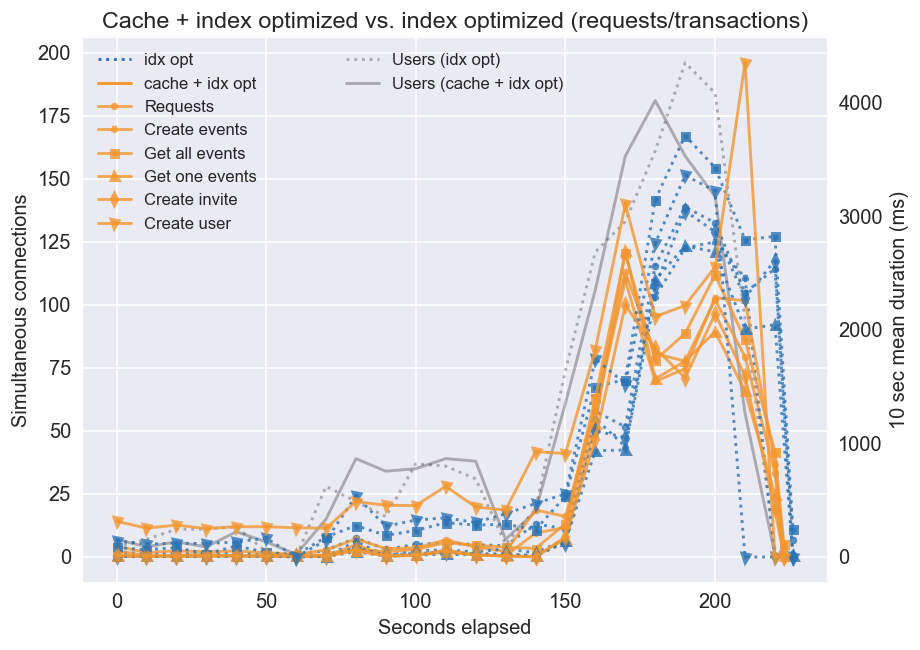

In [242]:
fig, ax = plt.subplots(1, 1, figsize=[8, 6])
ax.set_title('Cache + index optimized vs. index optimized (requests/transactions)', fontsize=14)

opt_index.plot_line(stat='users', col_name='count', ax=ax, color='#151515', ls=':', alpha=0.3, alias='Users (idx opt)')
opt_cache.plot_line(stat='users', col_name='count', ax=ax, color='#151515', alpha=0.3, alias='Users (cache + idx opt)')

ax1 = ax.twinx()
opt_index.plot_line(stat='fake', col_name='count', ax=ax1, ls=':', color='#2C73B4', alias='idx opt')
opt_cache.plot_line(stat='fake', col_name='count', ax=ax1, color='#F39730', alias='cache + idx opt')

opt_index.plot_line(stat='request', col_name='10sec_mean', ax=ax1, marker='.', ls=':', markersize=3, markeredgewidth=3,
                 color='#2C73B4', alpha=0.8)
opt_cache.plot_line(stat='request', col_name='10sec_mean', ax=ax1, marker='.', markersize=3, markeredgewidth=3,
                    color='#F39730', alias='Requests', alpha=0.8)

opt_index.plot_line(stat='tr_create_event_txn', col_name='10sec_mean', ax=ax1, marker='*', ls=':', markersize=3, markeredgewidth=3,
                 color='#2C73B4', alpha=0.8)
opt_cache.plot_line(stat='tr_create_event_txn', col_name='10sec_mean', ax=ax1, marker='*', markersize=3, markeredgewidth=3,
                    color='#F39730', alias='Create events', alpha=0.8)

opt_index.plot_line(stat='tr_get_all_events', col_name='10sec_mean', ax=ax1, marker='s', ls=':', markersize=3, markeredgewidth=3,
                 color='#2C73B4', alpha=0.8)
opt_cache.plot_line(stat='tr_get_all_events', col_name='10sec_mean', ax=ax1, marker='s', markersize=3, markeredgewidth=3,
                    color='#F39730', alias='Get all events', alpha=0.8)

opt_index.plot_line(stat='tr_get_one_events_txn', col_name='10sec_mean', ax=ax1, marker='^', ls=':', markersize=3, markeredgewidth=3,
                 color='#2C73B4', alpha=0.8)
opt_cache.plot_line(stat='tr_get_one_events_txn', col_name='10sec_mean', ax=ax1, marker='^', markersize=3, markeredgewidth=3,
                    color='#F39730', alias='Get one events', alpha=0.8)

opt_index.plot_line(stat='tr_invite_create_txn', col_name='10sec_mean', ax=ax1, marker='d', ls=':', markersize=3, markeredgewidth=3,
                 color='#2C73B4', alpha=0.8)
opt_cache.plot_line(stat='tr_invite_create_txn', col_name='10sec_mean', ax=ax1, marker='d', markersize=3, markeredgewidth=3,
                    color='#F39730', alias='Create invite', alpha=0.8)


opt_index.plot_line(stat='tr_user_create_txn', col_name='10sec_mean', ax=ax1, marker='v', ls=':', markersize=3, markeredgewidth=3,
                 color='#2C73B4', alpha=0.8)
opt_cache.plot_line(stat='tr_user_create_txn', col_name='10sec_mean', ax=ax1, marker='v', markersize=3, markeredgewidth=3,
                    color='#F39730', alias='Create user', alpha=0.8)

ax.legend(loc='upper center')
ax.set_xlabel('Seconds elapsed', fontsize=12)
ax.set_ylabel('Simultaneous connections', fontsize=12)
ax1.set_ylabel('10 sec mean duration (ms)', fontsize=12)
ax1.legend(loc='upper left')
ax.tick_params(labelsize=12)
ax1.tick_params(labelsize=12)
ax1.grid(b=False, which='both', axis='y')
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/compare-cache-to-idx-opt-transactions.pdf')

# Scaling test final results
## Vertical scaling

In [415]:
root_folder = '/Users/randal/courses/cs_291a/major_project/1337PACK_tsung_tests/tsung_analysis/final_results/'

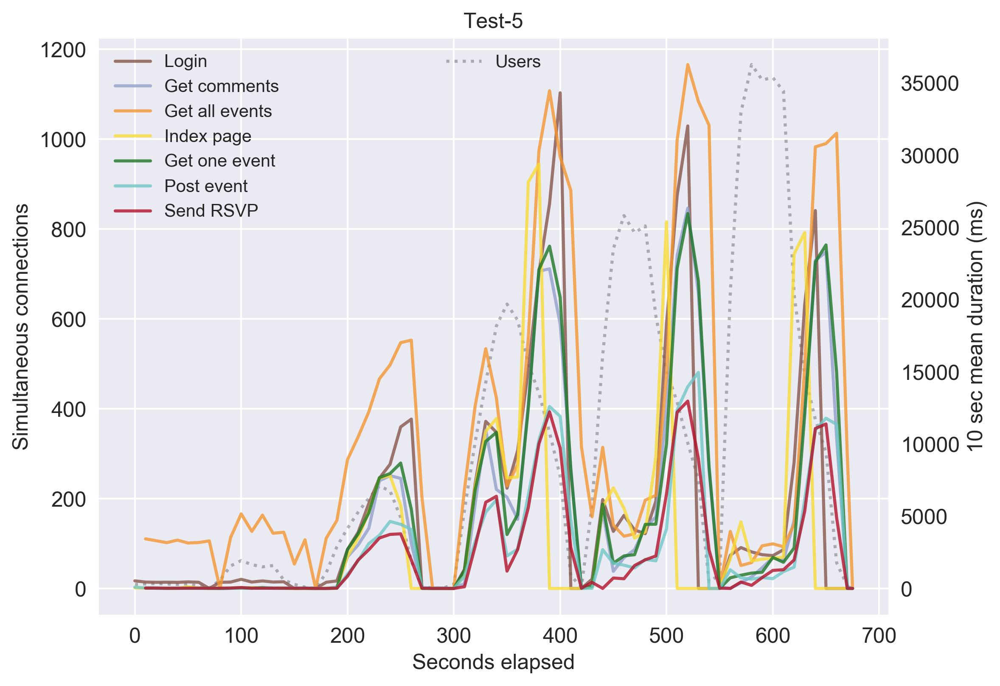

In [186]:
fig, ax = plt.subplots(1, 1, figsize=(8,6))
transac_plot(test_res, ax, add_legend=True)

In [246]:
fig_mtx = [
    [1, 2, 3, 17],
    [4, 5, 6, 12],
    [7, 8, 9, 13],
    [18, 14, 15, 16]
]

1

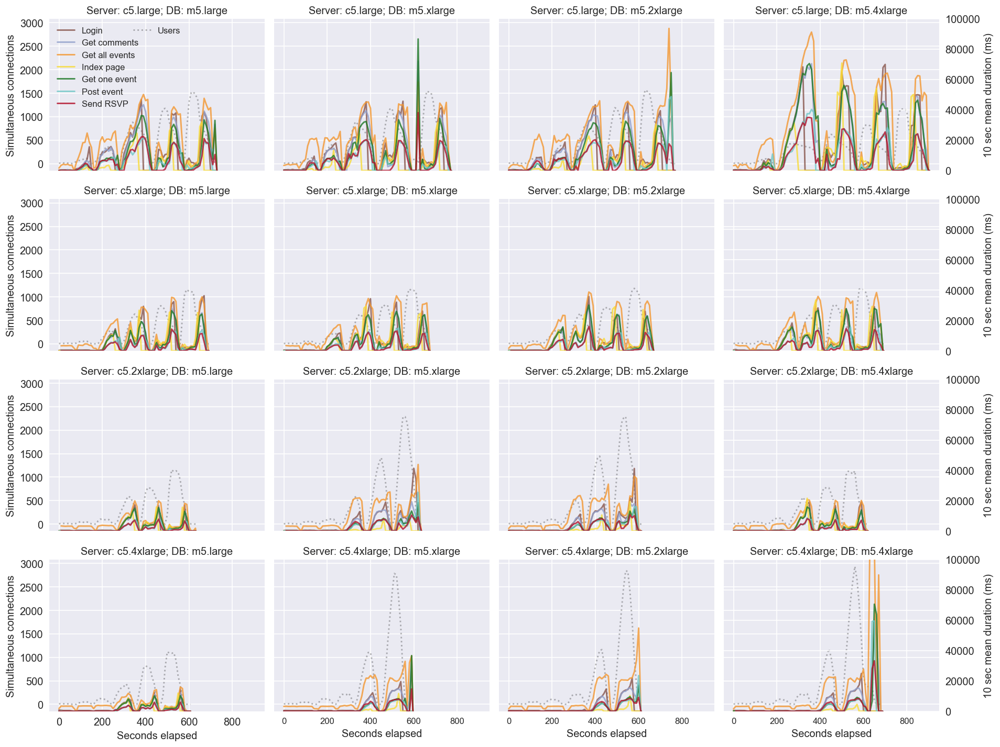

In [259]:
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharex='all', sharey='all')
inst_type = ['large', 'xlarge', '2xlarge', '4xlarge']

for i in range(16):
    idx = [int(i / 4), i % 4]
    test_res = TsungResults(root_folder + 'test-{}'.format(fig_mtx[idx[0]][idx[1]]))
    ax = axes[idx[0], idx[1]]
    alias = f"Server: c5.{inst_type[idx[0]]}; DB: m5.{inst_type[idx[1]]}"
    transac_plot(test_res, ax,
                 show_y_left=(idx[1] == 0),
                 show_y_right=(idx[1] == 3),
                 show_x=(idx[0] == 3),
                 add_legend=i == 0,
                alias=alias)
plt.tight_layout()

# save_fig('courses/cs_291a/major_project/1337PACK/report/figs/vertical-scale-transactions.pdf')

No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 500 found
No 502 found
No 504 found
No 401 found
No 409 found
No 500 found
No 502 found
No 504 found
No 401 found
No 409 found
No 502 found
No 504 found
No 401 found
No 409 found
No 502 found
No 504 found
No 401 found
No 409 found
No 502 found
No 504 found
No 401 found
No 409 found
No 500 found
No 502 found
No 504 found
No 401 found
No 409 found
No 503 found
No 401 found
No 409 found
No 503 found
No 401 found
No 409 found
No 500 found
No 502 found
No 504 found
No 401 found
No 409 found
No 502 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found


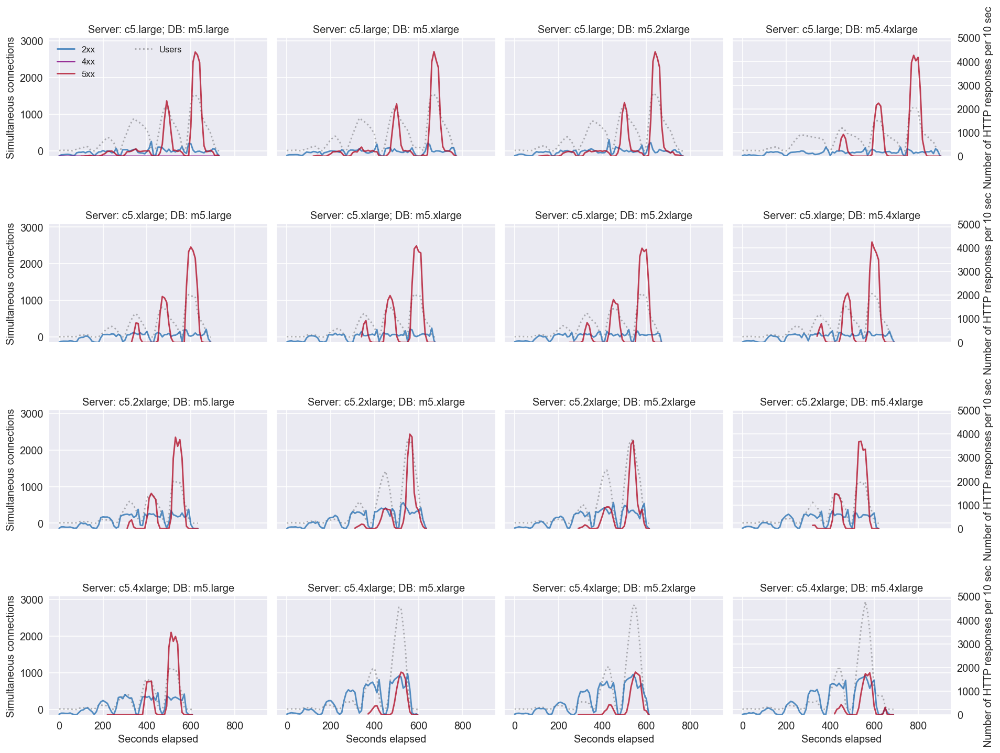

In [260]:
fig, axes = plt.subplots(4, 4, figsize=(16, 12), sharex='all', sharey='all')

inst_type = ['large', 'xlarge', '2xlarge', '4xlarge']
for i in range(16):
    idx = [int(i / 4), i % 4]
    test_res = TsungResults(root_folder + 'test-{}'.format(fig_mtx[idx[0]][idx[1]]))
    ax = axes[idx[0], idx[1]]
    alias = f"Server: c5.{inst_type[idx[0]]}; DB: m5.{inst_type[idx[1]]}"
    http_plot(test_res, ax,
              show_y_left=(idx[1] == 0),
              show_y_right=(idx[1] == 3),
              show_x=(idx[0] == 3),
              add_legend=i == 0,
              alias=alias
             )
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/vertical-scale-http-request.pdf')

In [204]:
codes

{200, 201, 401, 409, 500, 502, 503, 504}

## Horizontal scaling

No 401 found
No 409 found
No 500 found
No 502 found
No 504 found
No 503 found
No 504 found
No 401 found
No 409 found
No 500 found
No 502 found
No 504 found
No 401 found
No 409 found
No 502 found
No 504 found


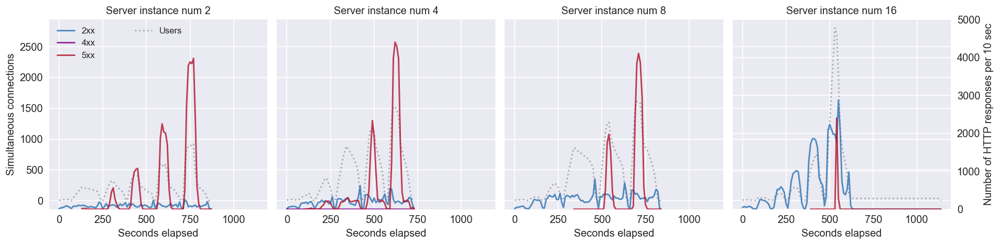

In [261]:
tests = [10, 1, 11, 20]
inst_num = [2, 4, 8, 16]

fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharex='all', sharey='all')

for i, (test, num)  in enumerate(zip(tests, inst_num)):
    test_res = TsungResults(root_folder + 'test-{}'.format(test ))
    ax = axes[i]
    alias = f"Server instance num {num}"
    http_plot(test_res, ax,
              show_y_left=(i == 0),
              show_y_right=(i == 3),
              show_x=True,
              add_legend=i == 0,
              alias=alias)
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/horizontal-scale-http-request.pdf')

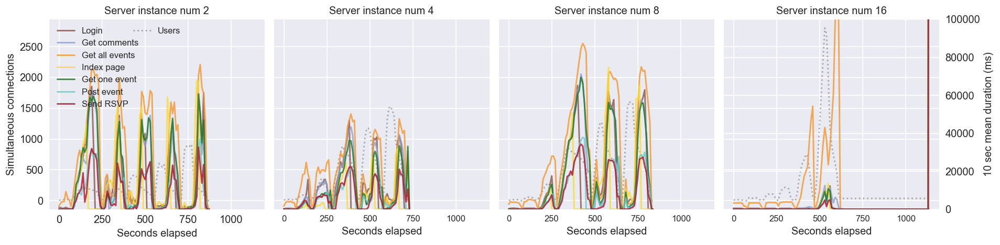

In [264]:
tests = [10, 1, 11, 20]
inst_num = [2, 4, 8, 16]

fig, axes = plt.subplots(1, 4, figsize=(16, 4), sharex='all', sharey='all')

for i, (test, num)  in enumerate(zip(tests, inst_num)):
    test_res = TsungResults(root_folder + 'test-{}'.format(test ))
    ax = axes[i]
    alias = f"Server instance num {num}"
    transac_plot(test_res, ax,
              show_y_left=(i == 0),
              show_y_right=(i == 3),
              show_x=True,
              add_legend=i == 0,
              alias=alias)
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/horizontal-scale-transaction.pdf')

## DB bottleneck & Server bottleneck

Test 24
21
26
22

In [393]:
test_mapper = {'test-24': ('c5.large', 'm5.large'),
               'test-21': ('c5.large', 'm5.2xlarge'),
               'test-26': ('c5.xlarge', 'm5.large')}

No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 502 found
No 503 found
No 504 found


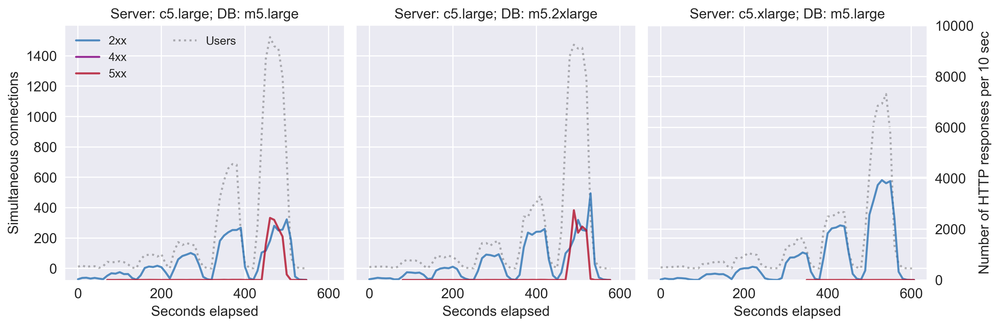

In [405]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharex='all', sharey='all')

for i, (test_name, config) in enumerate(test_mapper.items()):
    test_res = TsungResults(root_folder + test_name)
    ax = axes[i]
    alias = f"Server: {config[0]}; DB: {config[1]}"
    http_plot(test_res, ax,
              show_y_left=(i == 0),
              show_y_right=(i == 2),
              show_x=True,
              add_legend=i == 0,
              alias=alias)
    
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/new_figs/w-pagination-db-vs-server-http-request.pdf')

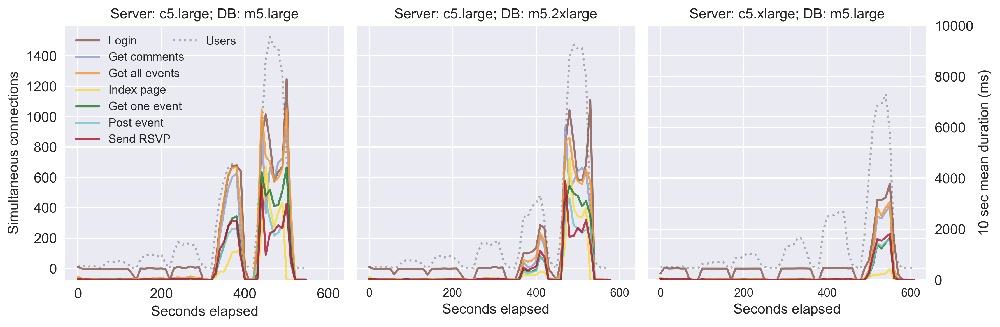

In [406]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharex='all', sharey='all')

for i, (test_name, config) in enumerate(test_mapper.items()):
    test_res = TsungResults(root_folder + test_name)
    ax = axes[i]
    alias = f"Server: {config[0]}; DB: {config[1]}"
    transac_plot(test_res, ax,
              show_y_left=(i == 0),
              show_y_right=(i == 2),
              show_x=True,
              add_legend=i == 0,
              alias=alias)
plt.tight_layout()

save_fig('courses/cs_291a/major_project/1337PACK/report/new_figs/w-pagination-db-vs-server-transaction.pdf.pdf')

In [449]:
data_mtx = [
    [24, 207, 301],
    [208, 302, None],
    [303, None, None]
]

y_list = ('c5.large', 'c5.xlarge', 'c5.2xlarge')
x_list = (4, 8, 16)

No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found
No 401 found
No 409 found
No 503 found
No 504 found


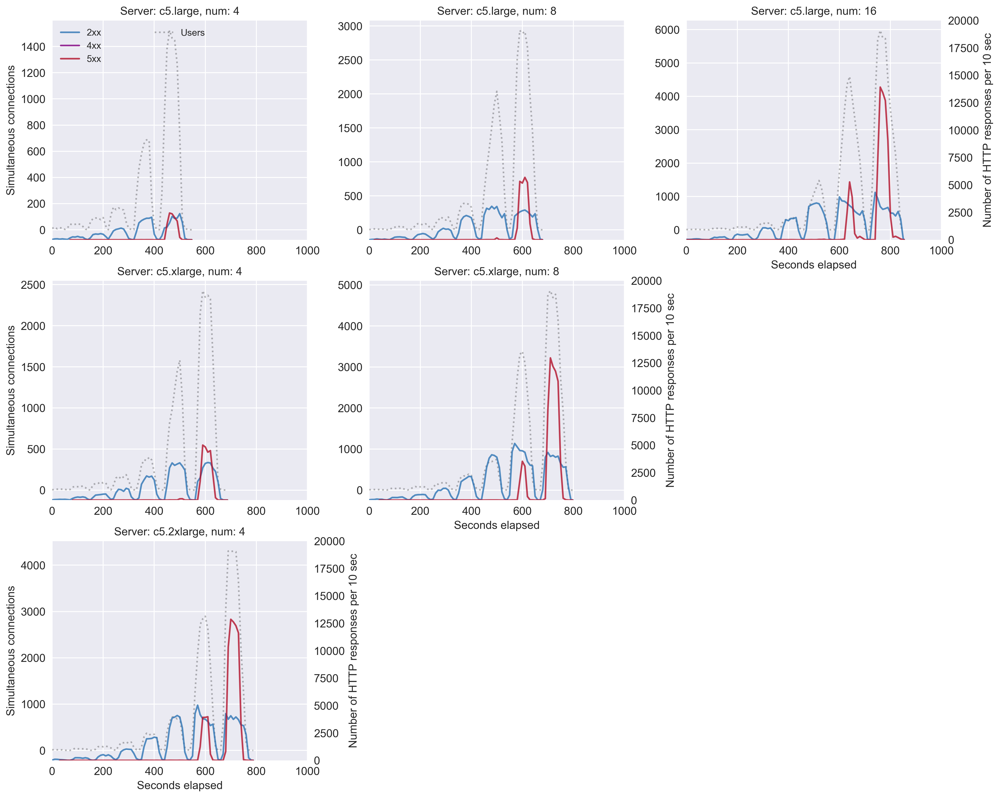

In [452]:
fig, axes = plt.subplots(3, 3, figsize=(15, 12))

for iy, yrow in enumerate(data_mtx):
    for ix, sample in enumerate(yrow):
        ax = axes[iy, ix]
        if sample is not None:
            test_res = TsungResults(root_folder + f'test-{int(sample)}')
            alias = f"Server: {y_list[iy]}, num: {x_list[ix]}"
            http_plot(test_res, ax,
                      show_y_left=(ix == 0),
                      show_y_right=(iy == 2-ix),
                      show_x=(iy == 2-ix),
                      add_legend=(ix == 0 and iy ==0),
                      alias=alias,
                      ylim=(0, 20_000))
        else:
            ax.axis('off')
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/new_figs/scaling-http-request.pdf')

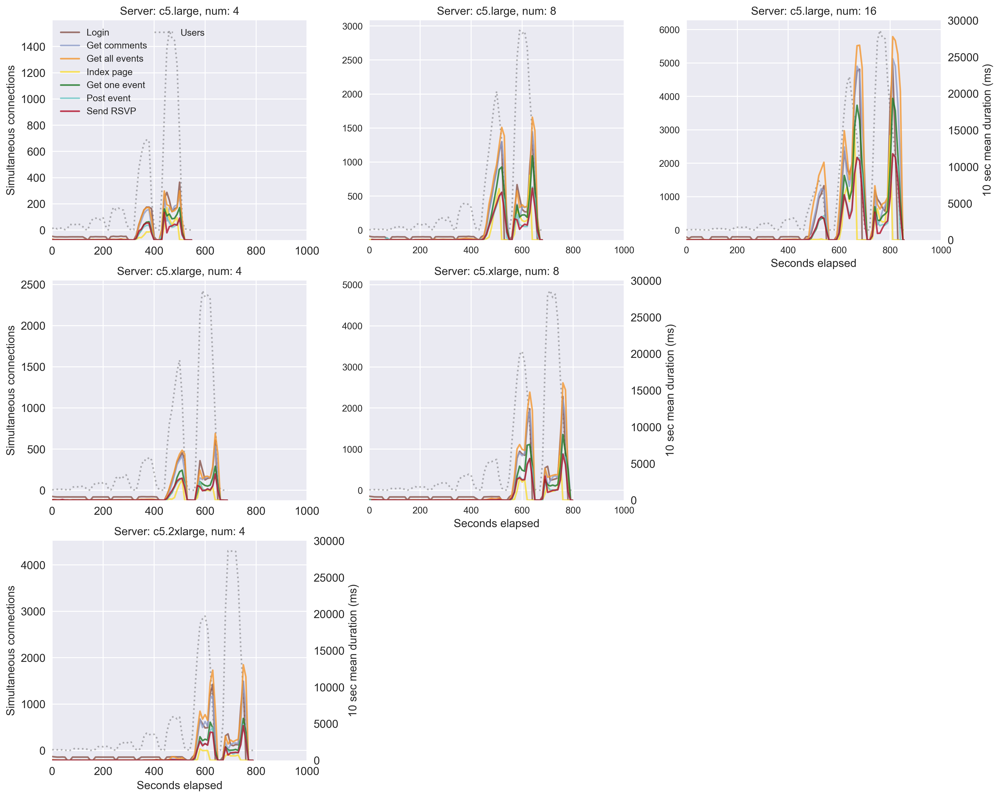

In [453]:
vfig, axes = plt.subplots(3, 3, figsize=(15, 12))

for iy, yrow in enumerate(data_mtx):
    for ix, sample in enumerate(yrow):
        ax = axes[iy, ix]
        if sample is not None:
            test_res = TsungResults(root_folder + f'test-{int(sample)}')
            alias = f"Server: {y_list[iy]}, num: {x_list[ix]}"
            transac_plot(test_res, ax,
                         show_y_left=(ix == 0),
                         show_y_right=(iy == 2-ix),
                         show_x=(iy == 2-ix),
                         add_legend=(ix == 0 and iy ==0),
                         alias=alias,
                         ylim=(0, 30_000))
        else:
            ax.axis('off')
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/new_figs/scaling-response-time.pdf')

No 401 found
No 409 found
No 502 found
No 503 found
No 504 found
No 401 found
No 409 found
No 502 found
No 503 found
No 504 found
No 401 found
No 409 found
No 502 found
No 503 found
No 504 found


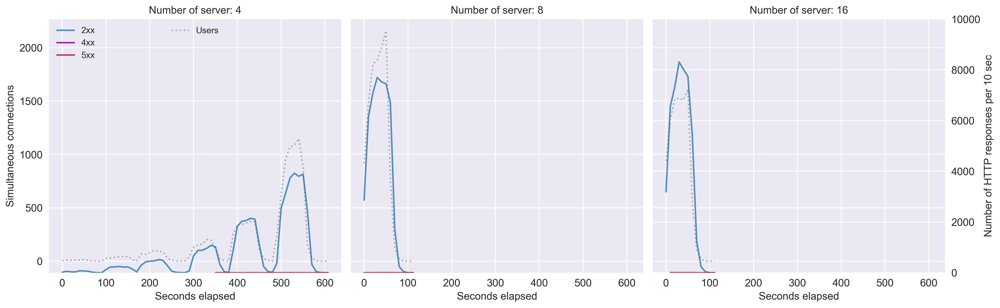

In [289]:
fig, axes = plt.subplots(3, 3, figsize=(16, 5), sharex='all', sharey='all')

for i, (test_name, num) in enumerate(test_mapper.items()):
    test_res = TsungResults(root_folder + test_name)
    ax = axes[i]
    alias = f"Number of server: {num}"
    http_plot(test_res, ax,
              show_y_left=(i == 0),
              show_y_right=(i == 2),
              show_x=True,
              add_legend=i == 0,
              alias=alias
             )
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/pagination-horizontal-http-request.pdf')

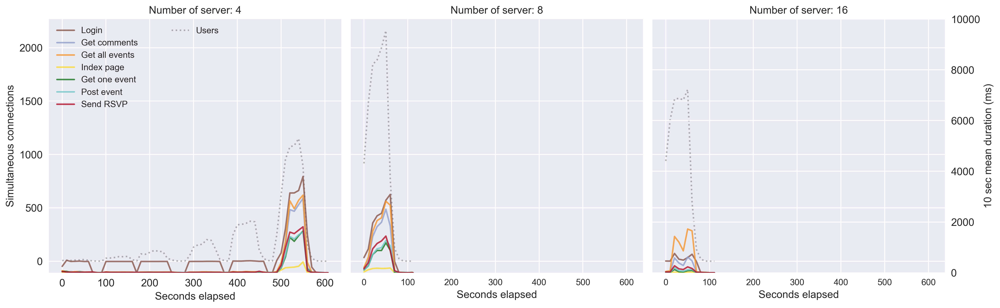

In [290]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharex='all', sharey='all')

for i, (test_name, num) in enumerate(test_mapper.items()):
    test_res = TsungResults(root_folder + test_name)
    ax = axes[i]
    alias = f"Number of server: {num}"
    transac_plot(test_res, ax,
              show_y_left=(i == 0), 
              show_y_right=(i == 2),
              show_x=True,
              add_legend=i == 0,
              alias=alias)
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/figs/pagination-horizontal-transaction.pdf')

### Database scaling

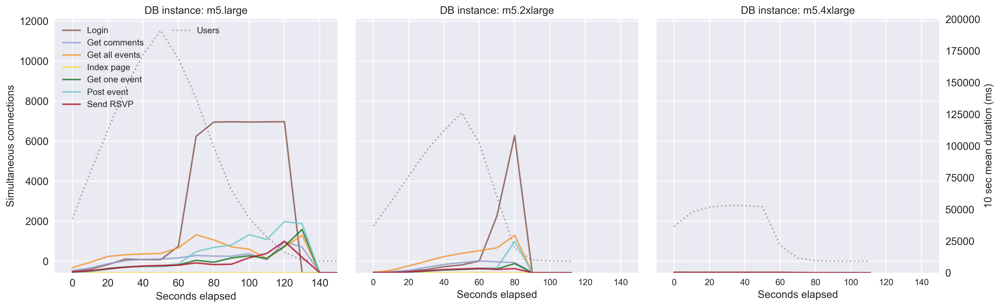

In [464]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharex='all', sharey='all')

test_mapper = {
    '501': 'm5.large',
    '503': 'm5.2xlarge',
    '502': 'm5.4xlarge',
}

for i, (test_name, server) in enumerate(test_mapper.items()):
    test_res = TsungResults(root_folder + 'test-' + test_name)
    ax = axes[i]
    alias = f"DB instance: {server}"
    transac_plot(test_res, ax,
              show_y_left=(i == 0), 
              show_y_right=(i == 2),
              show_x=True,
              add_legend=i == 0,
              alias=alias,
                xlim=(-10, 150),
                 ylim=(0, 200_000))
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/new_figs/db-vertical-transaction.pdf')

No 401 found
No 409 found
No 502 found
No 503 found
No 401 found
No 409 found
No 502 found
No 503 found
No 401 found
No 409 found
No 502 found
No 503 found
No 504 found


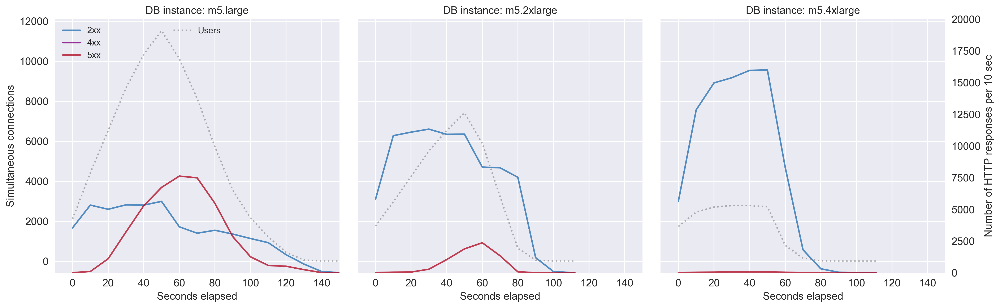

In [465]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharex='all', sharey='all')

test_mapper = {
    '501': 'm5.large',
    '503': 'm5.2xlarge',
    '502': 'm5.4xlarge',
}

for i, (test_name, server) in enumerate(test_mapper.items()):
    test_res = TsungResults(root_folder + 'test-' + test_name)
    ax = axes[i]
    alias = f"DB instance: {server}"
    http_plot(test_res, ax,
              show_y_left=(i == 0), 
              show_y_right=(i == 2),
              show_x=True,
              add_legend=i == 0,
              alias=alias,
              xlim=(-10, 150),
              ylim=(0, 20_000)
             )
plt.tight_layout()
save_fig('courses/cs_291a/major_project/1337PACK/report/new_figs/db-vertical-http-requests.pdf')